In [1]:
import pandas as pd
import numpy as np
import random as rd 
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import sklearn as sk
import statsmodels.stats.api as sms 
from scipy import stats
import statsmodels.api as sm

REAL STATE - BUENOS AIRES

En este trabajo se presentara informacion estadistica clave para entender el mercado de inmuebles en Buenos Aires, Argentina. Se buscara abordar cuestiones que pasan por la mente de un agente el cual busca optimizar el rendimiento de su capital adentrandose en el mundo del real state.

Para entender este mercado es importante entender que compone el valor de una propiedad. Para esto surge preguntas como, que es lo que realmente altera el valor de las propiedades? Existe algo que por si solo pueda darle una gran variacion al precio de una propiedad? Que es y como encontrarlo? Este trabajo intentara abordar estas preguntas con una vision microeconomica y estadistica, pero me parece necesario resaltar que no estoy teniendo en cuenta una mirada historica y macroeconomica que sin lugar a duda hay tener en cuenta esto para realizar un analisis completo. La volatilidad en el precio del metro cuadrado en Argentina es muy grande a lo largo de periodos de tiempo no mayores a 20 años, es por esto que el fenomeno macroeconomico no debe dejarse de lado.

Habiendo echo esta aclaracion tambien es hay que darle importancia a los factores microeconomicos, son a su vez de suma importancia afectando significativamente el precio del metrocuadrado. Como dije, este trabajo presentara informacion y analisis estadisticos para ayudar al inversor a tomar una decicion optima. 

Usare un data set de Keaggle que recolecto los datos en el año 2019 a travez de una pagina de venta de propiedades llamada Properati (https://www.kaggle.com/datasets/alejandromendivil/bsas-realstate-on-sale).
Aclaracion sobre varaibles.
l1: Pais
l2: Zona
l3: Barrio


Lectura y limpieza del dataframe.

In [9]:

df = pd.read_csv("D:/Nico@ThisHost/OneDrive/Documentos/NICOLAS/Data Science fundamentos/DATA SETS/regresion/realstateBSAS.csv")
# Convertir las fechas a datetime y convertir los errores a NaT
df["start_date"] = pd.to_datetime(df["start_date"], format="%Y-%m-%d", errors='coerce')
df["end_date"] = pd.to_datetime(df["end_date"], format="%Y-%m-%d", errors='coerce')
# df["price"] = pd.to_numeric(df["price"], downcast='float')
# df.to_csv('realstateBSAS.csv', index=False)

# Limipando valor atipico sin sentido
indices = [76894, 28275, 95484, 89351, 116213]
df.drop(indices, inplace=True)

# Limpiando valores repetidos
df.drop_duplicates(inplace=True)


Creando variables artificiales de utilidad.

In [11]:
# Precio metro cuadrado
df["pm2"] = df["price"] / df["surface_total"]

# Filtrar registros con fecha no nula en 'end_date'
sales_filter = df[df['end_date'].notna()]

# Contar la cantidad de registros filtrados
sales = len(sales_filter)

# Crear una columna para indicar si la propiedad se vendió o no
df["sold"] = ~df['end_date'].isna()
df['sold'] = df['sold'].astype(float)


Estas son las variables que utilizare:

Aclaracion, la variable sold hace referencia al porcentaje de propiedades que se venden.

In [8]:
df.columns

Index(['start_date', 'end_date', 'created_on', 'lat', 'lon', 'l1', 'l2', 'l3',
       'rooms', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered',
       'price', 'currency', 'title', 'description', 'property_type',
       'operation_type', 'pm2', 'sold'],
      dtype='object')

Zonas con mas cantidad publicaciones.

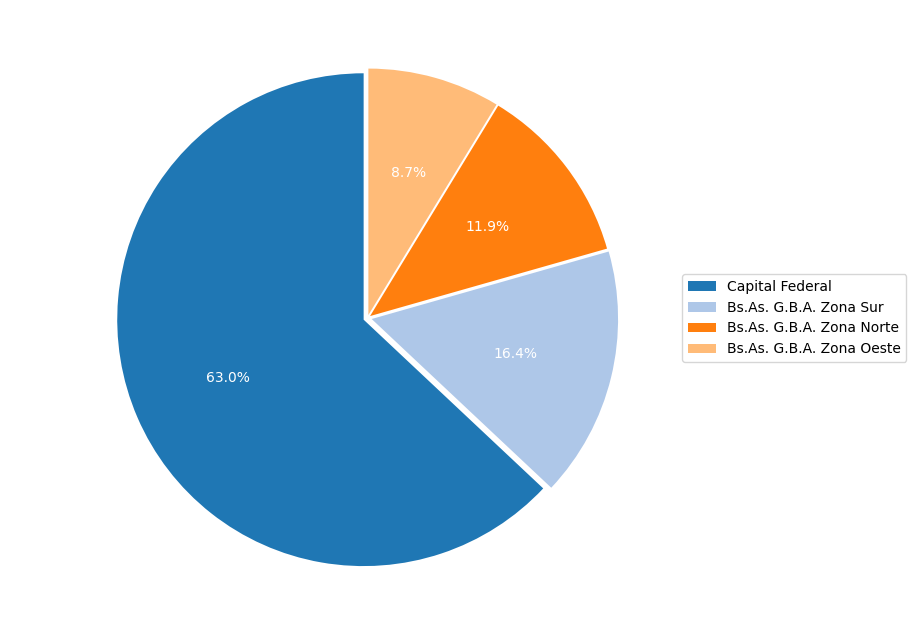

In [5]:
# Importar las bibliotecas matplotlib y random
import matplotlib.pyplot as plt
import random

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(10, 8))

# Obtener los nombres de los barrios
types = df["l2"].unique().tolist()

# Obtener los números de ventas por barrio
sales_num = df["l2"].value_counts().tolist()

# Obtener los colores de la paleta tab20
colors = plt.cm.tab20.colors

# Generar una lista de valores de separación
explode = [random.uniform(0.01, 0.02) for _ in range(len(types))]

# Dibujar el gráfico de torta con los valores, las etiquetas, los colores y los porcentajes
wedges, texts, autotexts = ax.pie(sales_num, explode=explode, labels=types, colors=colors, 
                                  autopct="%1.1f%%", startangle=90, textprops=dict(color="w"))

# Crear una leyenda para el gráfico
ax.legend(wedges, types, loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

# Mostrar el gráfico
plt.show()

Datos relevantes segun la zona de Buenos Aires, expresados con la media (properties for sale, es la suma de propiedades en venta).

In [6]:
# Precio metro cuadrado
df["pm2"] = df["price"] / df["surface_total"]

# Filtrar registros con fecha no nula en 'end_date'
sales_filter = df[df['end_date'].notna()]

# Contar la cantidad de registros filtrados
sales = len(sales_filter)


# Agrupar por la variable "l2" y calcular las estadísticas deseadas
df_grouped = df.groupby("l2").agg({
    "pm2": "mean",
    "price": "mean",
    "rooms": "mean",
    "bathrooms": "mean",
    "sold": "mean",  # Calcula la proporción de propiedades vendidas
    "l2": "size"  # Cuenta el total de propiedades en cada grupo
})

# Renombrar la columna "l2" a "properties for sale"
df_grouped.rename(columns={"l2": "properties for sale"}, inplace=True)

# Ordenar los datos por pm2 de forma descendente
df_sorted = df_grouped.sort_values("pm2", ascending=False)

# Restablecer el índice
df_sorted = df_sorted.reset_index()

# Mostrar las columnas deseadas
print(df_sorted[["l2", "pm2", "price", "rooms", "bathrooms", "sold", "properties for sale"]])


                         l2          pm2          price     rooms  bathrooms  \
0           Capital Federal  2750.880365  260128.904203  2.962905   1.560241   
1  Bs.As. G.B.A. Zona Norte  1947.060656  242147.669410  3.241653   1.800244   
2  Bs.As. G.B.A. Zona Oeste  1190.405802  155527.413848  3.244887   1.509470   
3    Bs.As. G.B.A. Zona Sur  1136.222602  195180.637165  3.386581   1.590345   

       sold  properties for sale  
0  0.874710                90901  
1  0.856823                23691  
2  0.690808                12565  
3  0.626954                17140  


Mismo analisis para los barrios de Buenos Aires

In [14]:
# Precio metro cuadrado
df["pm2"] = df["price"] / df["surface_total"]

# Filtrar registros con fecha no nula en 'end_date'
sales_filter = df[df['end_date'].notna()]

# Contar la cantidad de registros filtrados
sales = len(sales_filter)

# Agrupar por la variable "l3" y calcular las estadísticas deseadas
df_grouped = df.groupby("l3").agg({
    "pm2": "mean",
    "price": "mean",
    "rooms": "mean",
    "bathrooms": "mean",
    "sold": "mean",  # Calcula la proporción de propiedades vendidas
    "l3": "size"  # Cuenta el total de propiedades en cada grupo
})

# Renombrar la columna "l3" a "properties for sale"
df_grouped.rename(columns={"l3": "properties for sale"}, inplace=True)

# Ordenar los datos por pm2 de forma descendente
df_sorted = df_grouped.sort_values("pm2", ascending=False)

# Restablecer el índice
df_sorted = df_sorted.reset_index()

# Mostrar las columnas deseadas
display(df_sorted[["l3", "pm2", "price", "rooms", "bathrooms", "sold", "properties for sale"]])
df_sorted.to_csv('datos_inmobiliarios.csv', index=False)

,l3,pm2,price,rooms,bathrooms,sold,properties for sale
0,Puerto Madero,6056.145091,960157.665094,3.038915,2.688019,0.946344,1696
1,Las Cañitas,3856.936693,468680.859355,3.184516,2.230469,0.917419,775
2,Palermo,3466.463593,350426.939512,2.946077,1.615049,0.927634,12796
3,Belgrano,3358.055213,375539.681805,3.160923,1.899512,0.894130,6848
4,Recoleta,3339.500727,411249.452214,3.445375,1.816142,0.915370,5849
...,...,...,...,...,...,...,...
84,Marcos Paz,448.756630,173200.000000,3.571429,1.548387,0.771429,35
85,San Vicente,431.423655,235330.220339,3.681356,2.376682,0.691525,295
86,General Rodríguez,417.104482,224554.925000,4.125000,1.977358,0.814286,280
87,Cañuelas,392.456650,326566.666667,3.657407,2.260870,0.722222,108


Mostrando los 10 barrios con mas porcentaje de ventas sobre publicaciones, de esta forma podremos encontrar cuales son los barrios que tienen una demanda alta.

In [16]:
# Calcular el valor del percentil 25 (Q1) para la variable "sold"
Q1 = df_sorted['sold'].quantile(0.89)

# Filtrar los datos para incluir solo registros con "sold" por encima del 25%
df_filtered = df_sorted[df_sorted['sold'] > Q1]

# Crear una tabla con los barrios (l3), el precio del pm2 y la variable "sold"
top_sold = df_filtered[['l3', 'pm2', 'sold']]
top_sold = top_sold.sort_values(by='sold', ascending=False)

# Mostrar la tabla
print(top_sold)



                   l3          pm2      sold
15  Parque Centenario  2433.588796  0.979430
6        Barrio Norte  3088.828020  0.952786
0       Puerto Madero  6056.145091  0.946344
32           Paternal  2078.743552  0.933908
18             Abasto  2403.633569  0.931416
2             Palermo  3466.463593  0.927634
46               Once  1942.870726  0.927203
34         Tribunales  2067.804554  0.922652
19            Almagro  2403.469106  0.920312
16       Villa Crespo  2429.915853  0.918117


Como referencia, media vairable sold.

In [9]:
avrg_sold = df["sold"].mean() 
avrg_sold

0.826330415739759

Analisis sobre la cantidad de datos nulos.

In [10]:
df[df.isnull().any(axis=1)] # any missing data in columns

,start_date,end_date,created_on,lat,lon,l1,l2,l3,rooms,bedrooms,...,surface_total,surface_covered,price,currency,title,description,property_type,operation_type,pm2,sold
17,2019-10-17,2019-10-22,2019-10-17,NaN,NaN,Argentina,Bs.As. G.B.A. Zona Norte,Tigre,2.0,1.0,...,53.0,42.0,145000.0,USD,Qbay Golf 1 dormitorio vista al agua (180418),EN VENTA CON RENTA!!! Ideal Inversionista Estu...,Departamento,Venta,2735.849057,1.0
26,2019-10-17,NaT,2019-10-17,NaN,NaN,Argentina,Bs.As. G.B.A. Zona Oeste,Morón,2.0,1.0,...,45.0,45.0,110000.0,USD,VENTA DEPARTAMENTO EN CIUDAD JARDIN,Venta departamento de 2 ambientes en excelente...,Departamento,Venta,2444.444444,0.0
35,2019-10-17,2019-12-23,2019-10-17,NaN,NaN,Argentina,Capital Federal,Palermo,2.0,1.0,...,81.0,76.0,410000.0,USD,Nuevo Ingreso Palacio Bellini Alquiler,Excelente departamento de dos ambientes de 81m...,Departamento,Venta,5061.728395,1.0
36,2019-10-17,2019-10-27,2019-10-17,NaN,NaN,Argentina,Capital Federal,Palermo,2.0,1.0,...,42.0,38.0,169000.0,USD,Precioso Departamento con cochera Zona univer...,Excelente ubicación a una cuadra y media de av...,Departamento,Venta,4023.809524,1.0
46,2019-10-17,2019-10-31,2019-10-17,NaN,NaN,Argentina,Capital Federal,Palermo,2.0,1.0,...,52.0,46.0,159500.0,USD,Departamento de 2 ambientes en Venta en Palerm...,2 Amplios y hermosos ambientes ambientes -C...,Departamento,Venta,3067.307692,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146568,2019-07-31,2019-08-14,2019-07-31,NaN,NaN,Argentina,Bs.As. G.B.A. Zona Norte,Tigre,2.0,1.0,...,57.0,46.0,120000.0,USD,VENTA - DEPARTAMENTO 2 AMBIENTES - CONTRAFRENT...,•Venta Departamentos en Complejo “Jardines del...,Departamento,Venta,2105.263158,1.0
146570,2019-07-31,2019-08-14,2019-07-31,NaN,NaN,Argentina,Bs.As. G.B.A. Zona Norte,Tigre,2.0,1.0,...,57.0,46.0,117000.0,USD,VENTA - DEPARTAMENTO 2 AMBIENTES - FRENTE - JA...,•Venta Departamentos en Complejo “Jardines del...,Departamento,Venta,2052.631579,1.0
146575,2019-07-31,2019-08-14,2019-07-31,NaN,NaN,Argentina,Bs.As. G.B.A. Zona Norte,Tigre,2.0,1.0,...,64.0,56.0,141000.0,USD,VENTA - DEPARTAMENTO 2 AMBIENTES TIPO DUPLEX- ...,•Venta Departamentos en Complejo “Jardines del...,Departamento,Venta,2203.125000,1.0
146577,2019-07-31,2019-08-14,2019-07-31,NaN,NaN,Argentina,Bs.As. G.B.A. Zona Norte,Tigre,3.0,2.0,...,89.0,71.0,167000.0,USD,VENTA - DEPARTAMENTO 3 AMBIENTES AL RÍO - JARD...,•Venta Departamentos en Complejo “Jardines del...,Departamento,Venta,1876.404494,1.0


missing data (40213/146660) 30% de los registros tiene un campo faltante

In [11]:
from sklearn.neighbors import KNeighborsRegressor

# function that imputes a dataframe 
def impute_knn(df):
    
    ''' inputs: pandas df containing feature matrix '''
    ''' outputs: dataframe with NaN imputed '''
    # imputation with KNN unsupervised method

    # separate dataframe into numerical/categorical
    ldf = df.select_dtypes(include=[np.number])           # select numerical columns in df
    ldf_putaside = df.select_dtypes(exclude=[np.number])  # select categorical columns in df
    # define columns w/ and w/o missing data
    cols_nan = ldf.columns[ldf.isna().any()].tolist()         # columns w/ nan 
    cols_no_nan = ldf.columns.difference(cols_nan).values     # columns w/o nan 

    for col in cols_nan:                
        imp_test = ldf[ldf[col].isna()]   # indicies which have missing data will become our test set
        imp_train = ldf.dropna()          # all indicies which which have no missing data 
        model = KNeighborsRegressor(n_neighbors=5)  # KNR Unsupervised Approach
        knr = model.fit(imp_train[cols_no_nan], imp_train[col])
        ldf.loc[df[col].isna(), col] = knr.predict(imp_test[cols_no_nan])
    
    return pd.concat([ldf,ldf_putaside],axis=1)

rellenamos los datos faltantes con aprendizaje no supervisado

In [12]:
# Call function that imputes missing data
df2 = impute_knn(df)
# looks like we have a full feature matrix
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 144297 entries, 0 to 146659
Data columns (total 21 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   lat              144297 non-null  float64       
 1   lon              144297 non-null  float64       
 2   rooms            144297 non-null  float64       
 3   bedrooms         144297 non-null  float64       
 4   bathrooms        144297 non-null  float64       
 5   surface_total    144297 non-null  float64       
 6   surface_covered  144297 non-null  float64       
 7   price            144297 non-null  float64       
 8   pm2              144297 non-null  float64       
 9   sold             144297 non-null  float64       
 10  start_date       144297 non-null  datetime64[ns]
 11  end_date         119237 non-null  datetime64[ns]
 12  created_on       144297 non-null  object        
 13  l1               144297 non-null  object        
 14  l2               144297 n

In [13]:
df2.isnull()

,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,pm2,sold,...,end_date,created_on,l1,l2,l3,currency,title,description,property_type,operation_type
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146655,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
146656,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
146657,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
146658,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


Veamos un mapa de calor, destacando las zonas con precios mas caros 

In [17]:
import plotly_express as px

df2 = df.dropna(subset=["lat", "lon"])
df2 = df.drop_duplicates(subset=["lat", "lon"])
df2 = df.groupby(["lat", "lon"])["pm2"].mean().reset_index()

fig = px.density_mapbox(df, lat="lat", lon="lon", z="pm2", radius=20, center=dict(lat=df2.lat.mean(),
                        lon=df2.lon.mean()), zoom=10, mapbox_style="open-street-map", height=900, color_continuous_scale="Viridis")

fig.show()

Los barrios con mas ventas


In [15]:
from sklearn.model_selection import train_test_split
trdata,tedata = train_test_split(df2,test_size=0.3,random_state=43)

In [16]:
df_num = df.select_dtypes(include=np.number)
df_num.corr() 

,lat,lon,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,pm2,sold
lat,1.000000,-0.975749,-0.010494,0.008122,0.019961,-0.019287,-0.003842,0.014240,0.215111,0.028585
lon,-0.975749,1.000000,-0.007345,-0.017365,-0.029008,-0.049457,-0.014644,0.009252,0.162298,0.012039
rooms,-0.010494,-0.007345,1.000000,0.869021,0.614241,0.080888,0.074693,0.367160,-0.196443,0.037250
bedrooms,0.008122,-0.017365,0.869021,1.000000,0.588654,0.079148,0.072337,0.329605,-0.188111,0.121196
bathrooms,0.019961,-0.029008,0.614241,0.588654,1.000000,0.061288,0.069187,0.583755,0.104587,-0.017066
surface_total,-0.019287,-0.049457,0.080888,0.079148,0.061288,1.000000,0.430840,0.041153,-0.102945,-0.014452
surface_covered,-0.003842,-0.014644,0.074693,0.072337,0.069187,0.430840,1.000000,0.051703,-0.046040,-0.011667
price,0.014240,0.009252,0.367160,0.329605,0.583755,0.041153,0.051703,1.000000,0.492416,0.013966
pm2,0.215111,0.162298,-0.196443,-0.188111,0.104587,-0.102945,-0.046040,0.492416,1.000000,0.070963
sold,0.028585,0.012039,0.037250,0.121196,-0.017066,-0.014452,-0.011667,0.013966,0.070963,1.000000


Regresion sobre el precio del metro cuadrado.

In [17]:
# Limpieza de datos
df = df.dropna()
df = df.dropna(subset=["pm2"])
df_numeric = df.select_dtypes(include=["int64", "float64"])
df_numeric = df_numeric.drop(columns=["lon", "lat", "sold", "bedrooms"]) # elimina las variables que no quieres usar
# creando variables para la regresion
y = df_numeric["pm2"]
X = df_numeric.drop("pm2", axis=1)
# regresion 
X_constant = sm.add_constant(X)
lin_reg = sm.OLS(y,X_constant).fit()
lin_reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    pm2   R-squared:                       0.453
Model:                            OLS   Adj. R-squared:                  0.453
Method:                 Least Squares   F-statistic:                 1.737e+04
Date:                Wed, 14 Feb 2024   Prob (F-statistic):               0.00
Time:                        11:05:18   Log-Likelihood:            -8.6360e+05
No. Observations:              104718   AIC:                         1.727e+06
Df Residuals:                  104712   BIC:                         1.727e+06
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            2987.9544      7.288    410.008      0.000    2973.671    3002.238
rooms            -441.4674      2.620   -168.485      0.000    -446.603    -436.332
bathrooms           2.0398      4.720      0.432      0.666      -7.212      11.291
surface_total      -0.0888      0.002    -37.408      0.000      -0.093      -0.084
surface_covered     0.0020      0.004      0.561      0.575      -0.005       0.009
price               0.0032    1.3e-05    247.962      0.000       0.003       0.003
==============================================================================
Omnibus:                    54501.346   Durbin-Watson:                   1.315
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          8015910.914
Skew:                           1.478   Prob(JB):                         0.00
Kurtosis:                      45.760   Cond. No.                     9.62e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.62e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Regresion sobre el valor de la propiedad

In [18]:
# Limpieza de datos
df = df.dropna()
df = df.dropna(subset=["pm2"])
df_numeric = df.select_dtypes(include=["int64", "float64"])
df_numeric = df_numeric.drop(columns=["lon", "lat", "sold", "bedrooms"]) # elimina las variables que no quieres usar
# creando variables para la regresion
y = df_numeric["price"]
X = df_numeric.drop("price", axis=1)
# regresion 
X_constant = sm.add_constant(X)
lin_reg = sm.OLS(y,X_constant).fit()
lin_reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.591
Model:                            OLS   Adj. R-squared:                  0.591
Method:                 Least Squares   F-statistic:                 3.025e+04
Date:                Wed, 14 Feb 2024   Prob (F-statistic):               0.00
Time:                        11:05:18   Log-Likelihood:            -1.4127e+06
No. Observations:              104718   AIC:                         2.825e+06
Df Residuals:                  104712   BIC:                         2.826e+06
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -3.998e+05   1854.174   -215.596      0.000   -4.03e+05   -3.96e+05
rooms            6.457e+04    522.744    123.520      0.000    6.35e+04    6.56e+04
bathrooms        1.035e+05    834.867    123.995      0.000    1.02e+05    1.05e+05
surface_total       8.3915      0.452     18.572      0.000       7.506       9.277
surface_covered     2.8721      0.687      4.179      0.000       1.525       4.219
pm2               115.2052      0.465    247.962      0.000     114.295     116.116
==============================================================================
Omnibus:                   143131.600   Durbin-Watson:                   1.668
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        136420525.805
Skew:                           7.405   Prob(JB):                         0.00
Kurtosis:                     179.200   Cond. No.                     9.33e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.33e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

El coeficiente de Durbin-Watson puede variar entre en 0 y 4, si el valor es cercano a 2 significa que no hay autocorrelacion entre los residuos. si es menor a 2 hay correlacion positiva, y si es mayor lo contrario. Un error positivo en un período se asocia con un error positivo en el período siguiente, y lo mismo ocurre con los errores negativos1. Esto implica que el modelo no capta toda la información de los datos y que hay una dependencia temporal entre las observaciones.

In [19]:
resid_val = lin_reg.resid
fitted_val = lin_reg.predict()
lin_reg.resid.mean()

-4.814769977003193e-08

In [20]:
from scipy import stats

# probando homocedasticidad
stats.shapiro(lin_reg.resid) 
# El valor deberia estar cercano a 1  para indicar que los resiuduos tienen una distribucion normal

C:\Users\nicon\AppData\Local\Temp\ipykernel_9788\2582660315.py:4: UserWarning:

scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 104718.



ShapiroResult(statistic=0.6004019550754085, pvalue=9.369005537067673e-155)

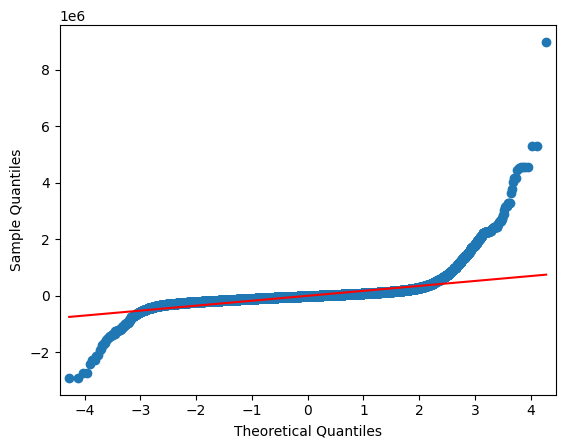

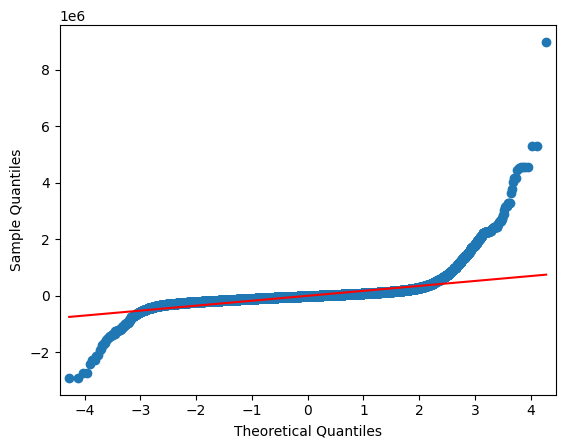

In [21]:
# Graficamos los residuos
sm.qqplot(resid_val,line="s") 

KeyboardInterrupt: 

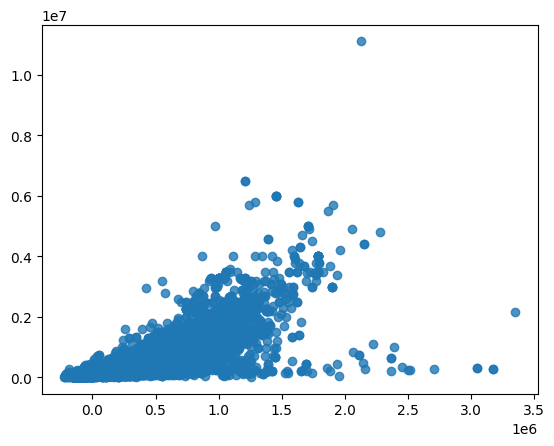

In [22]:
# linearidad del modelo
sns.regplot(x=fitted_val , y=y, lowess=True, line_kws={"color" : "red"})
plt.tittle("fited vrs observed")

no paso la prueba de homocedasticidad, teniendo mayores residuos para valores altos en las variables independientes

KeyboardInterrupt: 

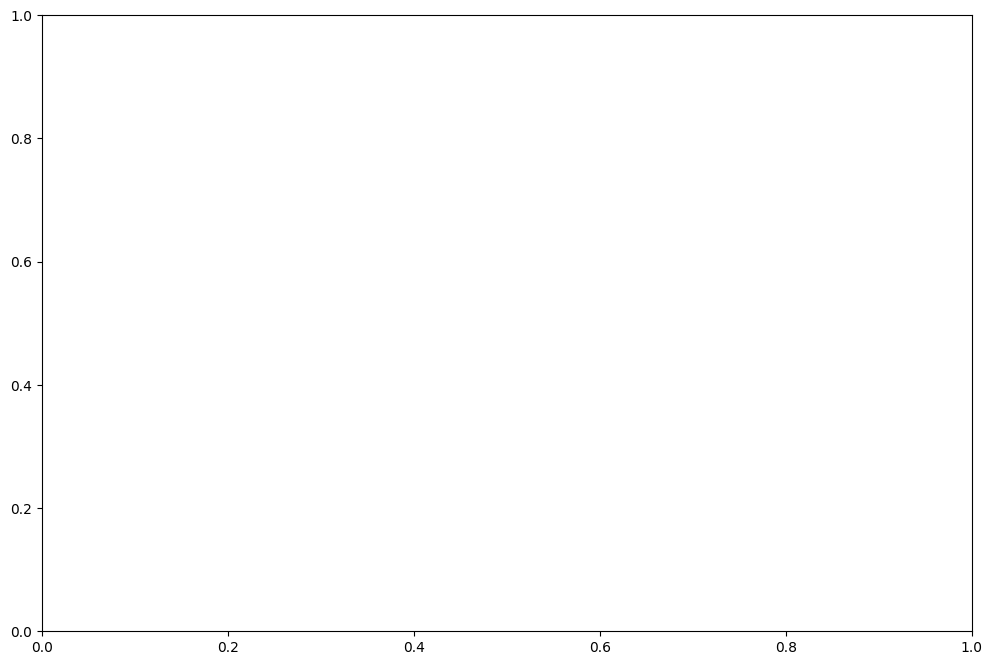

In [23]:
fig, ax = plt.subplots(figsize=(12,8))
sm.graphics.influence_plot(lin_reg, alpha = 0.05, ax = ax, criterion="cooks")
# Sirve para analizar si podemos obiar los casos extremos.

In [24]:
bp_test= sms.het_breuschpagan(resid_val,lin_reg.model.exog)
print(bp_test)
print("Breush-Pagan test: pvalue =" ,bp_test[1])

(7515.481121133027, 0.0, 1619.2194775050752, 0.0)
Breush-Pagan test: pvalue = 0.0


para que el modelo tenga heterocedasticidad el pvalue debe ser menor a 0.05, lo cual no se cumple y no hay homocedasticidad. La heterocedasticidad genera sesgos y aumenta la bondad del modelo(R2).

In [25]:
#multicolLinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = [variance_inflation_factor(X_constant.values, i) for i in range(X_constant.shape[1])]
pd.DataFrame({'vif': vif[1:]}, index=X.columns).T

#Hay que sacar variables que tengan una correlacion mayor a 5, se puede permiter hasta 10.

,rooms,bathrooms,surface_total,surface_covered,pm2
vif,1.814141,1.762413,1.293118,1.272183,1.152484


In [ ]:
# Limpiando data para el analisis 
mascara = df["l2"] == "Vicente López"
mascara = df["l2"] == "Barrio Norte"
mascara = df["l2"] == "Parque Centenario"
mascara = df["l2"] == "Abasto"
mascara = df["l2"] == "San Isidro"
mascara = df["l2"] == "Tigre"
mascara = df["l2"] == "San Isidro"
mascara = df["l2"] == "San Isidro"
mascara = df["l2"] == "San Isidro"
mascara = df["l2"] == "San Isidro"
mascara = df["l2"] == "San Isidro"
mascara = df["l2"] == "San Isidro"


df_CABA = df_grouped